# Data Visualization

This notebook is intended to help us visualize the data we are using. Since our data has 8 channels, one for each of the bands from the satellite images, we will need to create a composite of these channels for a "color" version of the images.

Below you will find code to randomly visualize images from the first two countries of each of the train/val/test partial splits.

## Setup

Install needed modules & run necessary imports.

In [1]:
!pip install python-magic
!pip install torch

Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com
You should consider upgrading via the '/home/ubuntu/anaconda3/envs/pytorch_latest_p37/bin/python -m pip install --upgrade pip' command.
Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com
You should consider upgrading via the '/home/ubuntu/anaconda3/envs/pytorch_latest_p37/bin/python -m pip install --upgrade pip' command.


In [5]:
!pip install geopandas
!pip install xarray
!pip install rioxarray
!pip install earthpy

Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com
You should consider upgrading via the '/home/ubuntu/anaconda3/envs/pytorch_latest_p37/bin/python -m pip install --upgrade pip' command.
Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com
     |████████████████████████████████| 845 kB 5.6 MB/s eta 0:00:01
You should consider upgrading via the '/home/ubuntu/anaconda3/envs/pytorch_latest_p37/bin/python -m pip install --upgrade pip' command.
Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com
     |████████████████████████████████| 47 kB 3.3 MB/s eta 0:00:011
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 19.3 MB 10.8 MB/s eta 0:00:01


  Created wheel for rioxarray: filename=rioxarray-0.9.1-py3-none-any.whl size=54590 sha256=d82ef43385678a6f6c1f1834c0e6395937b767de90fffd6824cfaaeb2f8aa28f
  Stored in directory: /home/ubuntu/.cache/pip/wheels/07/da/9e/1cc57b2e7a29a206893db83e984a341e2e94378263e0798229
Successfully built rioxarray
You should consider upgrading via the '/home/ubuntu/anaconda3/envs/pytorch_latest_p37/bin/python -m pip install --upgrade pip' command.
Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com
     |████████████████████████████████| 1.4 MB 7.0 MB/s eta 0:00:01
You should consider upgrading via the '/home/ubuntu/anaconda3/envs/pytorch_latest_p37/bin/python -m pip install --upgrade pip' command.


In [3]:
import sys
from concurrent.futures import ThreadPoolExecutor
import os
import magic

import numpy as np
import pandas as pd
import sklearn
from tqdm.auto import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.utils.data import sampler

import torchvision.datasets as dset
import torchvision.transforms as T

import torch.nn.functional as F  # useful stateless functions

In [10]:
import os
from glob import glob

import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
import xarray as xr
import rioxarray as rxr
import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep
import random

## Get Paths for Image Data

Run the cells below to get the data & labels from the main csv file. Set up the partial data splits for train, test, and val.

In [7]:
# dhs_final_labels.csv file in 231nproj
df = pd.read_csv('../../../../231nproj/dhs_final_labels.csv')
df['survey'] = df['DHSID_EA'].str[:10]
df['cc'] = df['DHSID_EA'].str[:2]

In [8]:
data_dir = '../../../../231nproj/data/'
df['path'] = data_dir + df['survey'] + '/' + df['DHSID_EA'] + '.npz'

In [9]:
path_years = df[['DHSID_EA', 'path', 'year']].apply(tuple, axis=1)
df.set_index('DHSID_EA', verify_integrity=True, inplace=True, drop=False) #had to add drop=False to keep column from disappearing  -- R
print(df['path'].iloc[0])
df.info()

../../../../231nproj/data/AL-2008-5#/AL-2008-5#-00000001.npz
<class 'pandas.core.frame.DataFrame'>
Index: 117644 entries, AL-2008-5#-00000001 to ZW-2015-7#-00000400
Data columns (total 24 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   DHSID_EA          117644 non-null  object 
 1   cname             117644 non-null  object 
 2   year              117644 non-null  int64  
 3   lat               117644 non-null  float64
 4   lon               117644 non-null  float64
 5   n_asset           86936 non-null   float64
 6   asset_index       86936 non-null   float64
 7   n_water           87938 non-null   float64
 8   water_index       87938 non-null   float64
 9   n_sanitation      89271 non-null   float64
 10  sanitation_index  89271 non-null   float64
 11  under5_mort       105582 non-null  float64
 12  n_under5_mort     105582 non-null  float64
 13  women_edu         117062 non-null  float64
 14  women_bmi         94866 non-n

In [134]:
label = "n_under5_mort"

SPLITS = {
    'train': [
        'AL', 'BD', 'CD', 'CM', 'GH', 'GU', 'HN', 'IA', 'ID', 'JO', 'KE', 'KM',
        'LB', 'LS', 'MA', 'MB', 'MD', 'MM', 'MW', 'MZ', 'NG', 'NI', 'PE', 'PH',
        'SN', 'TG', 'TJ', 'UG', 'ZM', 'ZW'],
    'val': [
        'BF', 'BJ', 'BO', 'CO', 'DR', 'GA', 'GN', 'GY', 'HT', 'NM', 'SL', 'TD',
        'TZ'],
    'test': [
        'AM', 'AO', 'BU', 'CI', 'EG', 'ET', 'KH', 'KY', 'ML', 'NP', 'PK', 'RW',
        'SZ']
}

SPLITS['trainval'] = SPLITS['train'] + SPLITS['val']

#partial splits

SPLITS['train_partial'] = SPLITS['train'][:2]
SPLITS['val_partial'] = SPLITS['val'][:2]
SPLITS['test_partial'] = SPLITS['test'][:2]
SPLITS['trainval_partial'] = SPLITS['train_partial'] + SPLITS['val_partial']


# Visualizing the Satellite Images

Using guidance from the article here (https://www.earthdatascience.org/courses/use-data-open-source-python/multispectral-remote-sensing/landsat-in-Python/), visualize the images by each band in grayscale and produce the RGB composite image for the "colored" version of the satellite image.

To produce the "natural color" image, we combine bands 4, 3, and 2 as the RGB components of the image. To see other possible combinations of the bands, see this post here: https://www.esri.com/arcgis-blog/products/product/imagery/band-combinations-for-landsat-8/?rmedium=redirect&rsource=blogs.esri.com/esri/arcgis/2013/07/24/band-combinations-for-landsat-8.


In [141]:
def visualize_random_images(paths, split):  # -> (N, C, H, W) model input X
    '''
    Args
    - paths: array (N, 1)
      - path: str, path to npz file containing single entry 'x'
        representing a (C, H, W) image

    Returns: X, input matrix (N, C, H, W)
    '''
    N = len(paths)  # should be 117644
    C, H, W = 8, 255, 255
    
    indices = []

    for i in range(10):
        n = random.randint(0, N)
        npz_path = paths[n][0]
        image_identifier = " for " + split + " Image " + str(n)
        image = np.load(npz_path)['x']
        image_xr = xr.DataArray(image, dims=["band", "x", "y"])
#         image_xr.plot.imshow(col="band", col_wrap=2)
#         image_xr.plot.gray()
#         plt.show()
        
        # Create RGB composite image for bands 4, 3, 2
        ep.plot_rgb(image_xr.values,
            rgb=[4, 3, 2],   #red, green, and blue "bands" using 4, 3, 2 for "natural" color (originally 3, 2, 1)
            title="RGB Composite Image" + image_identifier,
                   figsize=(4, 4))
            # Include the following parameters to plot_rgb to "stretch" the RGB values if needed
                # stretch=True, #stretch image to fill 0-255 RGB values (to avoid dark results)
                # str_clip=1)  #str_clip = higher number, brighter/stretched results
        plt.show()

        # Show the grayscale for each individual band
        for b in range(8): # for all 8 bands
            band = image[b] 
            plt.gray()
            plt.imshow(band)
            plt.title("Band " + str(b+1) + image_identifier)
            plt.show()

In [142]:
def compare_images(label, split):
    train_dhsids = df.index[df['cc'].isin(SPLITS[split]) & df[label].notna()]
    
    train_X_paths = df.loc[train_dhsids, 'path'].values.reshape(-1, 1)
    train_X = visualize_random_images(train_X_paths, split)

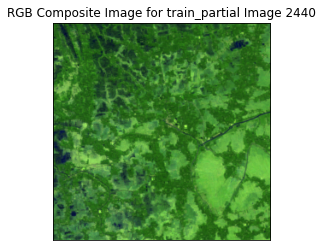

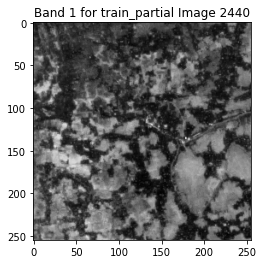

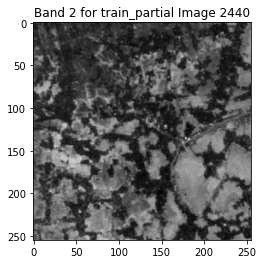

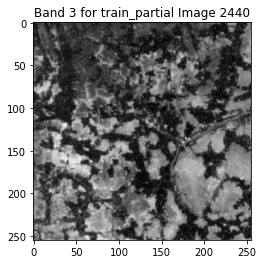

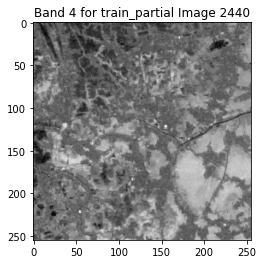

...

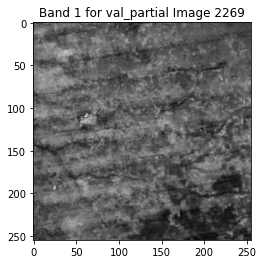

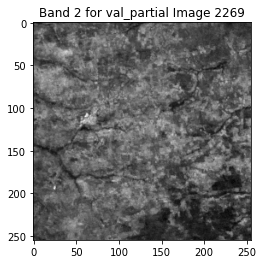

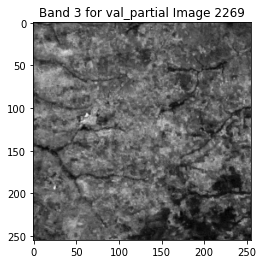

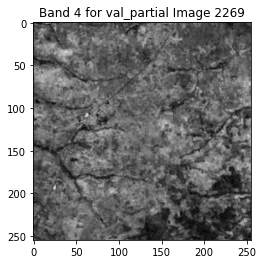

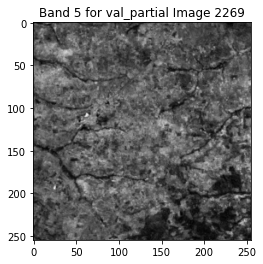

In [ ]:
compare_images(label, 'train_partial')
compare_images(label, 'val_partial')
compare_images(label, 'val_partial')